<a href="https://colab.research.google.com/github/xarvel/DataScience/blob/master/BIGGAN_birds_224.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#@title Requirements

!sudo apt-get -qq install gifsicle
!pip install tensorflow-gan tensorflow-addons imageio pygifsicle -q
!rm -rf sample_data checkpoints samples BigGANUtils
!mkdir checkpoints samples
!git clone -q https://github.com/xarvel/BigGANUtils.git

debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package gifsicle.
(Reading database ... 124016 files and directories currently installed.)
Preparing to unpack .../gifsicle_1.91-2_amd64.deb ...
Unpacking gifsicle (1.91-2) ...
Setting up gifsicle (1.91-2) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
     |████████████████████████████████| 367 kB 4.7 MB/s 
     |████████████████████████████████| 1.1 MB 82.6 MB/s 


In [2]:
import tensorflow.keras as k
import tensorflow as tf
from tensorflow.keras.layers import Concatenate, Flatten, Embedding, ReLU
from tensorflow.keras.layers import BatchNormalization, Reshape, Activation
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import os
import time
import numpy as np
import tensorflow_datasets as tfds
from tqdm import tqdm 
import tensorflow_addons as tfa
import functools
import json

from BigGANUtils.SelfAttention import SelfAttention
from BigGANUtils.GBlock import GBlock
from BigGANUtils.DBlock import DBlock
from BigGANUtils.SpectralNormalization import SpectralNormalization
from BigGANUtils.ConditionalBatchNormalization import ConditionalBatchNormalization
from BigGANUtils.SNDense import SNDense 
from BigGANUtils.SNConv2D import SNConv2D
from BigGANUtils.SNEmbedding import SNEmbedding
from BigGANUtils.sample_images import sample_images
from BigGANUtils.sample_single_image import sample_single_image
from BigGANUtils.combine_samples import combine_samples
from BigGANUtils.model_to_img import model_to_img
from BigGANUtils.make_distributed_train_step import make_distributed_train_step
from BigGANUtils.checkpoint_helpers import checkpoint_helpers
print(tf.__version__)

2.9.2


In [3]:
#@title TPU CONFIG

resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='')
tf.config.experimental_connect_to_cluster(resolver)
# This is the TPU initialization code that has to be at the beginning.
tf.tpu.experimental.initialize_tpu_system(resolver)
strategy = tf.distribute.TPUStrategy(resolver)
print("All devices: ", tf.config.list_logical_devices('TPU'))

All devices:  [LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:0', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:1', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:2', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:3', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:4', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:5', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:6', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:7', device_type='TPU')]


In [4]:
#@title CONFIG

IMAGE_SIZE = 224
IMAGE_CHANNELS = 3
DATASET_SIZE = 13262
BUFFER_SIZE = DATASET_SIZE
PER_REPILICA_BATCH_SIZE = 8
GLOBAL_BATCH_SIZE = PER_REPILICA_BATCH_SIZE * strategy.num_replicas_in_sync
EPOCHS = 30
STEPS_PER_EPOCH = DATASET_SIZE // PER_REPILICA_BATCH_SIZE
LATENT_DIM = 126
CHECKPOINT_DIR = 'checkpoints'
SAMPLES_DIR = 'samples'
CHECKPOINT_INTERVAL = 5
SEED = 1
NUM_CLASSES = 100
TFRECORD_PATH = 'gs://brids-xarvel/*.tfrec'
SAMPLE_INTERVAL = 1

GAN_FILTERS = 40
GENERATOR_LR = 0.0001
DISCRIMINATOR_LR = 0.0004
ADAM_BETA_1 = 0.0
ADAM_BETA_2 = 0.99
ADAM_EPSILON = 1e-07
SN_EPSILON = 1e-12
BN_EPSILON = 0.001

EMA_DECAY = 0.99
EMA_START = 20000

In [5]:
tf.random.set_seed(SEED)

weight_initializer = tf.keras.initializers.Orthogonal(seed=SEED)
fixed_noise = tf.random.truncated_normal((LATENT_DIM,), stddev=1)

In [6]:
#@title Dataset

def preprocess_image(img):
    return tf.cast(img, tf.float32) / 127.5 - 1.

def get_tfrecord_dataset(
    batch_size: int,
    tfrecord_path: str,
    is_training: bool,
    *,
    image_size: int,
):
    def parse_example(proto):
        features = {
          "image": tf.io.FixedLenFeature([], tf.string), 
          'height': tf.io.FixedLenFeature([], tf.int64),
          'width': tf.io.FixedLenFeature([], tf.int64),
          'channels': tf.io.FixedLenFeature([], tf.int64),
          'label_text': tf.io.FixedLenFeature([], tf.string), 
          'label_onehot':  tf.io.FixedLenSequenceFeature([], tf.int64, allow_missing=True),
          'label_number': tf.io.FixedLenFeature([], tf.int64),
        }

        parsed = tf.io.parse_single_example(
            serialized=proto,
            features=features
        )

        image, label = parsed["image"], parsed["label_number"]
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, (image_size, image_size))
    
        return image, label

    def augment(image, label):
      image = tf.image.random_flip_left_right(
          image, seed=SEED
      )

      return image, label  
    
    tfrecord_files = tf.io.gfile.glob(tfrecord_path)

    dataset = tf.data.TFRecordDataset(tfrecord_files)
    dataset = dataset.map(parse_example)
    
    if is_training:
      dataset = dataset.shuffle(BUFFER_SIZE, reshuffle_each_iteration=True, seed=SEED)
      dataset = dataset.repeat()
      dataset = dataset.map(augment)

    dataset = dataset.map(lambda image, label: (preprocess_image(image), label))
    dataset = dataset.batch(batch_size, drop_remainder=True)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
   
    return dataset

train_dataset = get_tfrecord_dataset(
    batch_size=GLOBAL_BATCH_SIZE,
    image_size=IMAGE_SIZE,
    tfrecord_path=TFRECORD_PATH, 
    is_training=False
) 

In [7]:
#@title Generator

class Generator(Model):
  def __init__(self, channels, num_classes, embedding_size, **kwargs):
    super(Generator, self).__init__(**kwargs)

    self.batch_normalization = tf.keras.layers.experimental.SyncBatchNormalization
    self.channels = channels
    self.dense = SNDense
    self.conv2d = SNConv2D
    self.sn_epsilon = SN_EPSILON
    self.bn_epsilon = BN_EPSILON

    self.linear = self.dense(
        units = 7 * 7 * 16 * channels, 
        use_bias=False, 
        kernel_initializer=weight_initializer, 
        sn_epsilon=self.sn_epsilon, 
        name='linear'
    )
    self.reshape = Reshape([7, 7, 16 * channels], name='reshape')

    res_block = functools.partial(
        GBlock,
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        dense=self.dense, 
        batch_normalization=self.batch_normalization,
        bn_epsilon=self.bn_epsilon, 
        sn_epsilon=self.sn_epsilon, 
    )

    self.res_block_1 = res_block(out_channels = 16 * channels, name='res_block_1')
    self.res_block_2 = res_block(out_channels = 8 * channels, name='res_block_2')  
    self.res_block_3 = res_block(out_channels = 4 * channels, name='res_block_3')  
    self.attention = SelfAttention(
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        sn_epsilon=self.sn_epsilon, 
        name='attention'
    )
    self.res_block_4 = res_block(out_channels = 2 * channels, name='res_block_4') 
    self.res_block_5 = res_block(out_channels = channels,name='res_block_5')     
    self.embedding = Embedding(
        input_dim = num_classes, 
        output_dim = embedding_size, 
        embeddings_initializer=weight_initializer, 
        name='embedding'
    )
    self.bn = self.batch_normalization(name='batch_normalization', epsilon=self.bn_epsilon)
    self.relu = ReLU(name='activation_relu')
    self.conv = self.conv2d(
        filters=IMAGE_CHANNELS, 
        kernel_size=3, 
        padding='same', 
        kernel_initializer=weight_initializer, 
        name='conv', 
        sn_epsilon=self.sn_epsilon
    )
    self.concat = Concatenate(name='concatenate');
    self.tanh = Activation('tanh', name = 'tanh');

  def call(self, inputs, training=None):    
    z, label = inputs    
    z_split = tf.split(z, num_or_size_splits=6, axis=-1)
    embed = self.embedding(label)
    conds = [self.concat([z_i, embed]) for z_i in z_split[1:]]
    x = self.linear(z_split[0], training=training)
    x = self.reshape(x)
    x = self.res_block_1([x, conds[0]], training=training)
    x = self.res_block_2([x, conds[1]], training=training)
    x = self.res_block_3([x, conds[2]], training=training)
    x = self.res_block_4([x, conds[3]], training=training)
    x = self.attention(x, training=training)
    x = self.res_block_5([x, conds[4]], training=training)
    x = self.bn(x, training=training)
    x = self.relu(x)
    x = self.conv(x, training=training)
    return self.tanh(x)

In [8]:
#@title Discriminator

class Discriminator(Model):
  def __init__(self, 
      channels, 
      num_classes, 
      dense = SNDense, 
      conv2d=SNConv2D,  
      embedding=SNEmbedding,
      sn_epsilon=SN_EPSILON,
      bn_epsilon=BN_EPSILON,
      **kwargs
    ):
    super(Discriminator, self).__init__(**kwargs)

    self.dense = dense
    self.conv2d = conv2d
    self.embedding = SNEmbedding
    self.sn_epsilon = sn_epsilon
    self.bn_epsilon = bn_epsilon

    res_block = functools.partial(
        DBlock,
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        sn_epsilon=self.sn_epsilon, 
    )

    self.res_block_1 = res_block(
        out_channels = 1 * channels, 
        downsample=True, 
        preactivation=False, 
        name='res_block_1'
    )
    self.res_block_2 = res_block(
        out_channels = 2 * channels, 
        downsample=True, 
        preactivation=True, 
        name='res_block_2'
    )
    self.res_block_3 = res_block(
        out_channels = 4 * channels, 
        downsample=True, 
        preactivation=True, 
        name='res_block_3'
    )
    self.res_block_4 = res_block(
        out_channels = 8 * channels, 
        downsample=True, 
        preactivation=True,  
        name='res_block_4'
    )

    self.res_block_5 = res_block(
        out_channels = 8 * channels, 
        downsample=True, 
        preactivation=True, 
        name='res_block_5'
    )

    self.res_block_6 = res_block(
        out_channels = 16 * channels, 
        downsample=False, 
        preactivation=True, 
        name='res_block_6'
    )

    self.attention = SelfAttention(
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        sn_epsilon=self.sn_epsilon,
        name='attention'
    )
    self.relu = ReLU(name='relu')
    self.embedding_1 = self.embedding(
        input_dim = num_classes, 
        output_dim = 16 * channels, 
        embeddings_initializer=weight_initializer, 
        sn_epsilon=self.sn_epsilon,
        name='embedding'
    )
    self.linear = self.dense(
        units = 1, 
        kernel_initializer=weight_initializer, 
        sn_epsilon=self.sn_epsilon, 
        name='linear'
    )
  
  @tf.function
  def call(self, inputs, training=False):
    x, label = inputs
    x = self.res_block_1(x, training=training)
    x = self.res_block_2(x, training=training)
    x = self.res_block_3(x, training=training)
    x = self.res_block_4(x, training=training)
    x = self.attention(x, training=training)
    x = self.res_block_5(x, training=training)
    x = self.res_block_6(x, training=training)
    x = self.relu(x)
    x = tf.reduce_sum(x, axis=[1, 2])
    out = self.linear(x, training=training)
    embed = self.embedding_1(label)
    out += tf.reduce_sum(x * embed, axis=-1, keepdims=True)
    return out

In [9]:
with strategy.scope():
  generator = Generator(GAN_FILTERS, num_classes=NUM_CLASSES, embedding_size=LATENT_DIM, name='generator')
  generator.build(input_shape=[(None, LATENT_DIM,), (None,)])
  discriminator = Discriminator(GAN_FILTERS, num_classes=NUM_CLASSES, name='discriminator')

In [10]:
train_dataset = strategy.distribute_datasets_from_function(
    lambda _: get_tfrecord_dataset(
    batch_size=PER_REPILICA_BATCH_SIZE,
    image_size=IMAGE_SIZE,
    tfrecord_path=TFRECORD_PATH, 
    is_training=True
))

In [11]:
def discriminator_loss(logits_real: tf.Tensor, logits_fake: tf.Tensor) -> tf.Tensor :
  real_loss = tf.reduce_mean(tf.nn.relu(1.0 - logits_real))
  fake_loss = tf.reduce_mean(tf.nn.relu(1.0 + logits_fake))
  
  return real_loss, fake_loss 

def generator_loss(logits_fake: tf.Tensor) -> tf.Tensor:
  loss = -tf.reduce_mean(logits_fake)
  
  return loss

In [12]:
with strategy.scope():
  generator_optimizer = tfa.optimizers.MovingAverage(Adam(
      learning_rate=GENERATOR_LR, 
      beta_1=ADAM_BETA_1, 
      beta_2=ADAM_BETA_2,
      epsilon=ADAM_EPSILON
  ), average_decay=EMA_DECAY, start_step=EMA_START)
  
  discriminator_optimizer = Adam(
      learning_rate=DISCRIMINATOR_LR, 
      beta_1=ADAM_BETA_1, 
      beta_2=ADAM_BETA_2, 
      epsilon=ADAM_EPSILON
  )

In [13]:
def sample_analytics(meta, save=False, show=True):
  history = meta['history']

  with plt.xkcd():
    fig, axs = plt.subplots(figsize=(10,10))
    plt.plot(history['gen_loss'], label='Generator loss')
    plt.plot(history['disc_loss_fake'], label='Discriminator loss fake')
    plt.plot(history['disc_loss_real'], label='Discriminator loss real')
    plt.title('Training process')
    
    plt.figtext(.7, .17, '\n'.join([
        'Epoch=%s' % meta['epoch'],
        "GEN_LR=%s" % GENERATOR_LR,
        'DISC_LR=%s' % DISCRIMINATOR_LR,
        'FILTERS=%s' % GAN_FILTERS,
        'PER_REPILICA_BATCH_SIZE=%s' % PER_REPILICA_BATCH_SIZE
    ]))

    fig.legend();

    if save:
      fig.savefig(SAMPLES_DIR + '/analytics_at_epoch_{:04d}.png'.format(meta['epoch'])) 
  
    if show:   
      plt.show()
    else:
      plt.close(fig)

In [14]:
sample_images = functools.partial(
    sample_images,
    num_classes = NUM_CLASSES,
    image_size = IMAGE_SIZE,
    noise = fixed_noise,
    generator = generator,
    save_dir = SAMPLES_DIR,
    zoom=0.5
)

In [15]:
#@title checkpoint

restore_checkpoint, save_checkpoint = checkpoint_helpers(
    generator_optimizer=generator_optimizer,
    discriminator_optimizer=discriminator_optimizer,
    generator=generator,
    discriminator=discriminator,
    dir=CHECKPOINT_DIR
)

defaultMeta = {
    "history": {
        "disc_loss_real": [],
        "disc_loss_fake": [],
        "gen_loss": []
    },
    "epoch": 1
}
meta = defaultMeta

META_FILE = CHECKPOINT_DIR + '/meta.json'

def restore_checkpoint_with_meta():
  try:
    with open(META_FILE) as f:
      meta = json.load(f)
      meta['epoch'] += 1
  except:
    meta = defaultMeta
    pass
  
  status = restore_checkpoint()

  return meta

def save_checkpoint_with_meta():
  print('Saving checkpoint');

  # Create folder if not exits
  if not os.path.isdir(SAMPLES_DIR):
    os.makedirs(CHECKPOINT_DIR, exist_ok=True)

  with open(META_FILE, 'w') as f:
    json.dump(meta, f)

  save_checkpoint()

meta = restore_checkpoint_with_meta();

(1, 224, 224, 3)


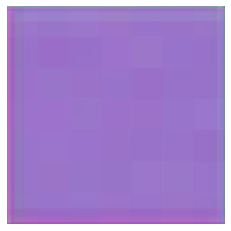

In [16]:
with strategy.scope():
  label = 89
  fixed_noise = tf.random.truncated_normal((LATENT_DIM,), stddev=1)
  generated_image = sample_single_image(
      generator=generator,
      label=label,
      noise=fixed_noise
  )

In [17]:
with strategy.scope():
  labels = tf.constant([label], dtype=tf.int64)
  images = tf.expand_dims(generated_image, axis=0)

  decision = discriminator([images, labels])
  print(decision)

tf.Tensor([[4.3803577]], shape=(1, 1), dtype=float32)


In [18]:
#@title train_step

train_step = make_distributed_train_step(
  generator=generator,
  discriminator=discriminator,
  discriminator_loss=discriminator_loss,
  generator_loss=generator_loss,
  generator_optimizer=generator_optimizer,
  discriminator_optimizer=discriminator_optimizer,
  batch_size=PER_REPILICA_BATCH_SIZE,
  latent_dim=LATENT_DIM,
  strategy=strategy
)

In [19]:
train_iterator = iter(train_dataset)

for epoch in range(meta['epoch'], EPOCHS + 1):
  meta['epoch'] = epoch
  start = time.time()
  print('Epoch: {}/{}'.format(epoch, EPOCHS))

  pbar = tqdm(range(STEPS_PER_EPOCH))
  for step in pbar:
    disc_loss_real, disc_loss_fake, gen_loss = train_step(train_iterator)
    meta['history']['disc_loss_real'].append(float(disc_loss_real));
    meta['history']['disc_loss_fake'].append(float(disc_loss_fake));
    meta['history']['gen_loss'].append(float(gen_loss));
    pbar.set_postfix({
        'disc_loss_real': round(float(disc_loss_real), 4), 
        'disc_loss_fake': round(float(disc_loss_fake), 4), 
        'gen_loss': round(float(gen_loss), 4)
    })
    pbar.set_description("Current step %s" % generator_optimizer.iterations.numpy())
    
  if epoch % SAMPLE_INTERVAL == 0:
    with strategy.scope():
      generator_optimizer.swap_weights()
      sample_images(epoch = epoch, save=True, show=False)
      generator_optimizer.swap_weights()
    
  if epoch % CHECKPOINT_INTERVAL == 0:
    save_checkpoint_with_meta()
    sample_analytics(meta, save=True, show=False)   

  print('Time for epoch {} is {} sec'.format(epoch, time.time()-start))

Epoch: 1/30


Current step 1657: 100%|██████████| 1657/1657 [10:53<00:00,  2.54it/s, disc_loss_real=0.0003, disc_loss_fake=0.0001, gen_loss=0.0256]


Time for epoch 1 is 667.9415702819824 sec
Epoch: 2/30


Current step 3314: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0206, disc_loss_fake=0, gen_loss=0.0266]


Time for epoch 2 is 460.77773213386536 sec
Epoch: 3/30


Current step 4971: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0086, disc_loss_fake=0.0004, gen_loss=0.0262]


Time for epoch 3 is 461.68538451194763 sec
Epoch: 4/30


Current step 6628: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0049, disc_loss_fake=0, gen_loss=0.0304]


Time for epoch 4 is 459.9169690608978 sec
Epoch: 5/30


Current step 8285: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0084, disc_loss_fake=0.0003, gen_loss=0.0293]


Saving checkpoint
Time for epoch 5 is 466.17272186279297 sec
Epoch: 6/30


Current step 9942: 100%|██████████| 1657/1657 [07:28<00:00,  3.70it/s, disc_loss_real=0.001, disc_loss_fake=0.0042, gen_loss=0.0174]


Time for epoch 6 is 459.71593379974365 sec
Epoch: 7/30


Current step 11599: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.005, disc_loss_fake=0.0002, gen_loss=0.0317]


Time for epoch 7 is 461.9975974559784 sec
Epoch: 8/30


Current step 13256: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0084, disc_loss_fake=0.0001, gen_loss=0.04]


Time for epoch 8 is 461.2923879623413 sec
Epoch: 9/30


Current step 14913: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0005, disc_loss_fake=0.0039, gen_loss=0.0186]


Time for epoch 9 is 461.04997849464417 sec
Epoch: 10/30


Current step 16570: 100%|██████████| 1657/1657 [07:28<00:00,  3.70it/s, disc_loss_real=0.0016, disc_loss_fake=0.0077, gen_loss=0.0121]


Saving checkpoint
Time for epoch 10 is 464.64563393592834 sec
Epoch: 11/30


Current step 18227: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0028, disc_loss_fake=0.0024, gen_loss=0.0279]


Time for epoch 11 is 461.8083517551422 sec
Epoch: 12/30


Current step 19884: 100%|██████████| 1657/1657 [07:28<00:00,  3.70it/s, disc_loss_real=0.0106, disc_loss_fake=0.0011, gen_loss=0.0259]


Time for epoch 12 is 460.7879240512848 sec
Epoch: 13/30


Current step 21541: 100%|██████████| 1657/1657 [07:28<00:00,  3.70it/s, disc_loss_real=0.0038, disc_loss_fake=0.0024, gen_loss=0.0214]


Time for epoch 13 is 460.55230832099915 sec
Epoch: 14/30


Current step 23198: 100%|██████████| 1657/1657 [07:28<00:00,  3.70it/s, disc_loss_real=0.0007, disc_loss_fake=0.0084, gen_loss=0.0122]


Time for epoch 14 is 460.845840215683 sec
Epoch: 15/30


Current step 24855: 100%|██████████| 1657/1657 [07:28<00:00,  3.70it/s, disc_loss_real=0.0011, disc_loss_fake=0.0036, gen_loss=0.0207]


Saving checkpoint
Time for epoch 15 is 463.85296535491943 sec
Epoch: 16/30


Current step 26512: 100%|██████████| 1657/1657 [07:28<00:00,  3.70it/s, disc_loss_real=0.0126, disc_loss_fake=0.0007, gen_loss=0.0289]


Time for epoch 16 is 463.8439767360687 sec
Epoch: 17/30


Current step 28169: 100%|██████████| 1657/1657 [07:29<00:00,  3.69it/s, disc_loss_real=0.0092, disc_loss_fake=0.0007, gen_loss=0.0338]


Time for epoch 17 is 461.9451470375061 sec
Epoch: 18/30


Current step 29826: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0009, disc_loss_fake=0.0061, gen_loss=0.0183]


Time for epoch 18 is 461.42535972595215 sec
Epoch: 19/30


Current step 31483: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0165, disc_loss_fake=0.0002, gen_loss=0.0371]


Time for epoch 19 is 461.5841407775879 sec
Epoch: 20/30


Current step 33140: 100%|██████████| 1657/1657 [07:28<00:00,  3.70it/s, disc_loss_real=0.0073, disc_loss_fake=0.0005, gen_loss=0.037]


Saving checkpoint
Time for epoch 20 is 464.426908493042 sec
Epoch: 21/30


Current step 34797: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0022, disc_loss_fake=0.0026, gen_loss=0.0265]


Time for epoch 21 is 461.3312656879425 sec
Epoch: 22/30


Current step 36454: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0129, disc_loss_fake=0.0004, gen_loss=0.0338]


Time for epoch 22 is 461.02478408813477 sec
Epoch: 23/30


Current step 38111: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0002, disc_loss_fake=0.0087, gen_loss=0.0132]


Time for epoch 23 is 463.94147634506226 sec
Epoch: 24/30


Current step 39768: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0075, disc_loss_fake=0.0008, gen_loss=0.036]


Time for epoch 24 is 461.4938943386078 sec
Epoch: 25/30


Current step 41425: 100%|██████████| 1657/1657 [07:28<00:00,  3.69it/s, disc_loss_real=0.0164, disc_loss_fake=0.0007, gen_loss=0.0377]


Saving checkpoint
Time for epoch 25 is 465.6781289577484 sec
Epoch: 26/30


Current step 43082: 100%|██████████| 1657/1657 [07:28<00:00,  3.70it/s, disc_loss_real=0.0015, disc_loss_fake=0.0054, gen_loss=0.0183]


Time for epoch 26 is 460.8213484287262 sec
Epoch: 27/30


Current step 44739: 100%|██████████| 1657/1657 [07:28<00:00,  3.70it/s, disc_loss_real=0.0007, disc_loss_fake=0.0059, gen_loss=0.0205]


Time for epoch 27 is 460.65262269973755 sec
Epoch: 28/30


Current step 46396: 100%|██████████| 1657/1657 [07:28<00:00,  3.70it/s, disc_loss_real=0.0011, disc_loss_fake=0.0032, gen_loss=0.0275]


Time for epoch 28 is 460.90454030036926 sec
Epoch: 29/30


Current step 48053: 100%|██████████| 1657/1657 [07:28<00:00,  3.70it/s, disc_loss_real=0.0005, disc_loss_fake=0.0044, gen_loss=0.0231]


Time for epoch 29 is 460.85325741767883 sec
Epoch: 30/30


Current step 49710: 100%|██████████| 1657/1657 [07:28<00:00,  3.70it/s, disc_loss_real=0.0047, disc_loss_fake=0.0003, gen_loss=0.0404]


Saving checkpoint
Time for epoch 30 is 465.51204681396484 sec


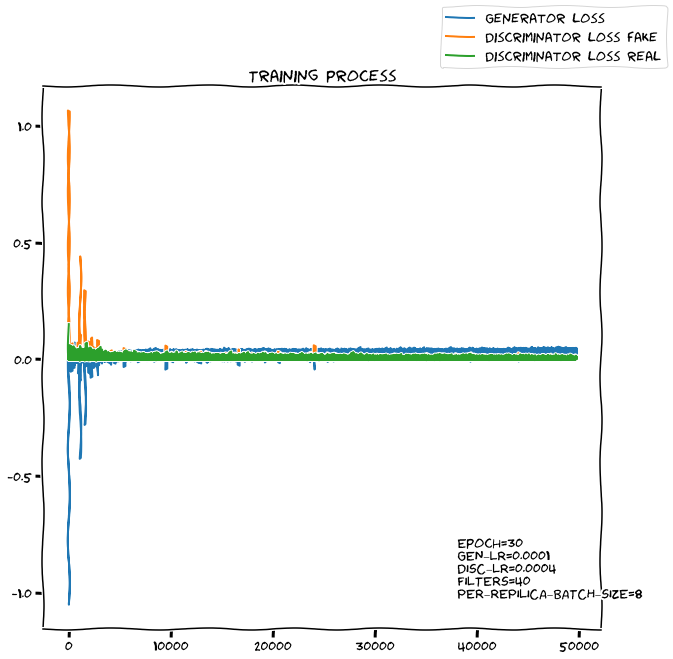

In [20]:
sample_analytics(meta, save=False, show=True)    

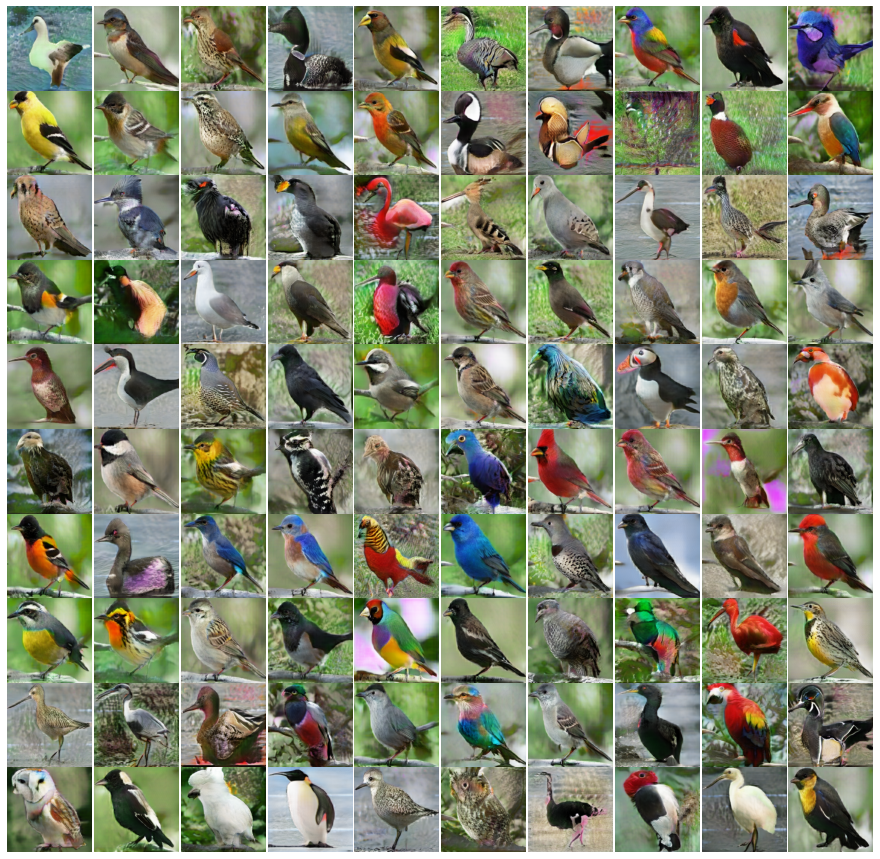

In [25]:
with strategy.scope():
  generator_optimizer.swap_weights()
  sample_images(epoch = meta['epoch'], save=False, show=True, noise = fixed_noise)
  generator_optimizer.swap_weights()

(1, 224, 224, 3)


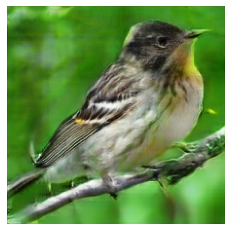

In [32]:
with strategy.scope():
  generator_optimizer.swap_weights()
  generated_image = sample_single_image(
      generator=generator,
      label=11,
      noise=tf.random.truncated_normal((LATENT_DIM,), stddev=1)
  )
  generator_optimizer.swap_weights()

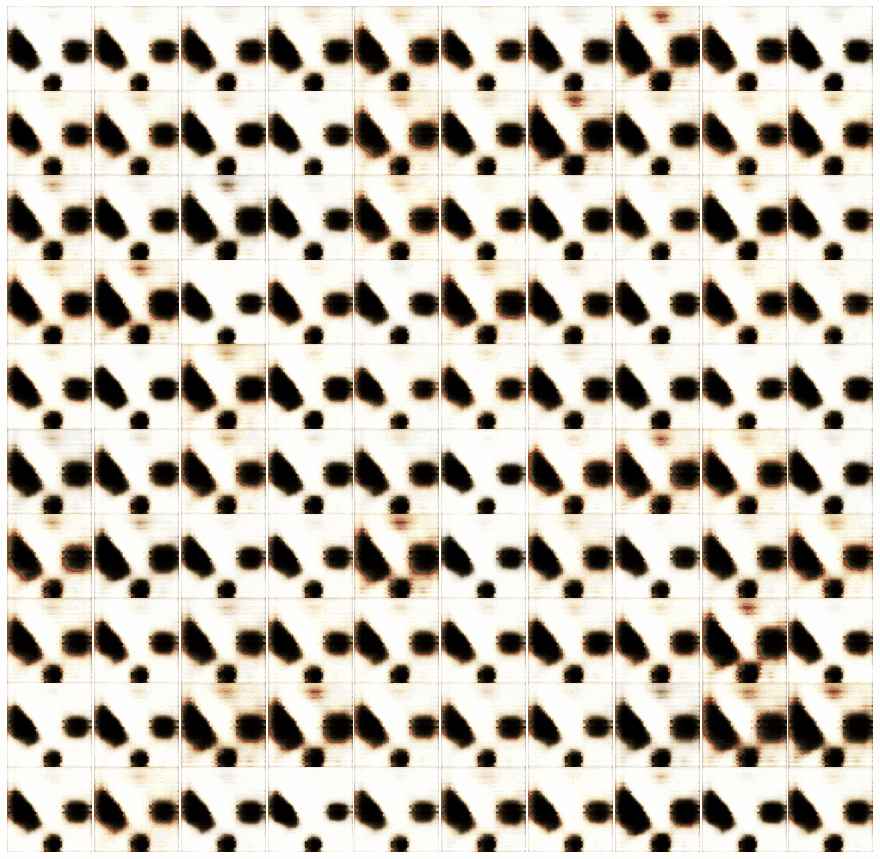

In [23]:
combine_samples(SAMPLES_DIR, 'image_at_epoch_*.jpeg')